In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2
%matplotlib inline

## Camera Calibration

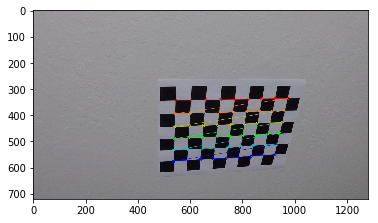

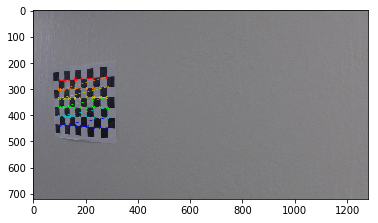

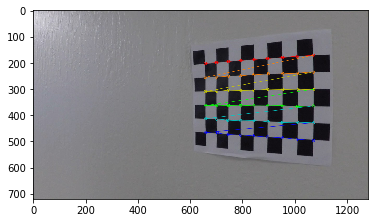

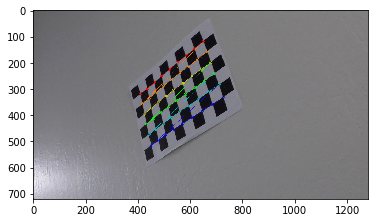

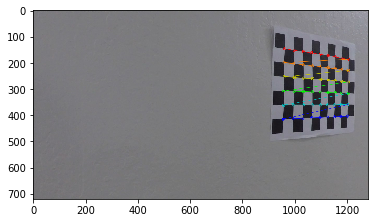

...

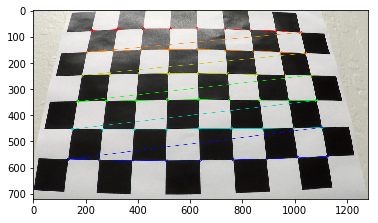

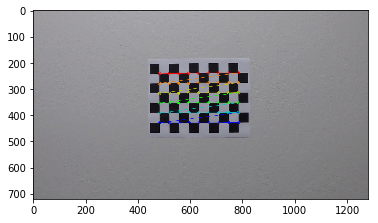

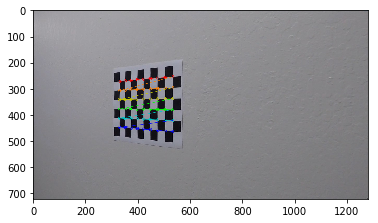

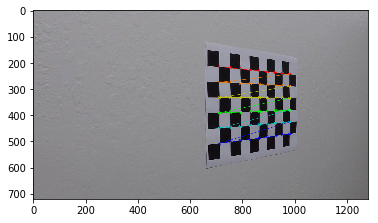

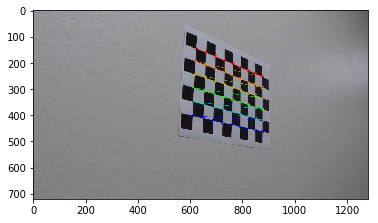

In [109]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
#read calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        f, ax = plt.subplots(1, 1)
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))


# Distortion Correction

In [110]:
img_size = (img.shape[1], img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
def cal_undistort(img):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    #undist = np.copy(img)  # Delete this line
    return dst

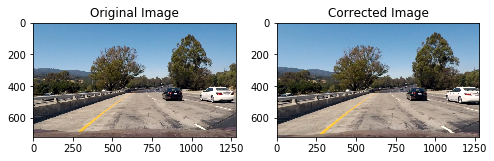

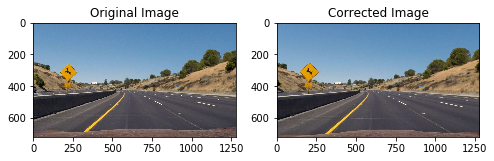

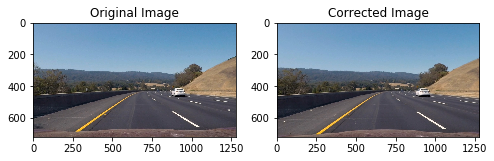

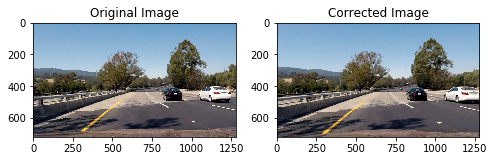

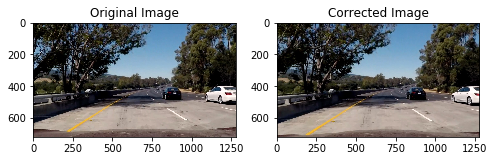

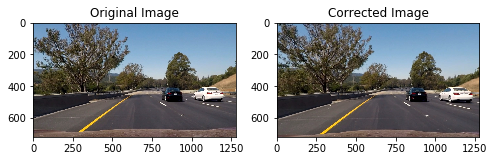

In [4]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = cv2.imread(image)
    dst = cal_undistort(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image')
    ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    ax2.set_title('Corrected Image')

# Perspective Transform

In [88]:
def perspec_trans(img): #img: undistorted image
    img_size = (img.shape[1], img.shape[0])
    corners = np.float32([[250,720],[600,457],[720,457],[1145,720]])
    new_top_left=np.array([corners[0,0],0])
    new_top_right=np.array([corners[3,0],0])
    offset=[150,0]
    src = np.float32([corners[0],corners[1],corners[2],corners[3]])
    dst = np.float32([corners[0]+offset,new_top_left+offset,new_top_right-offset ,corners[3]-offset])
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(np.copy(img), M, img_size)
    
    return warped, M

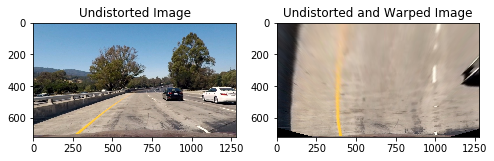

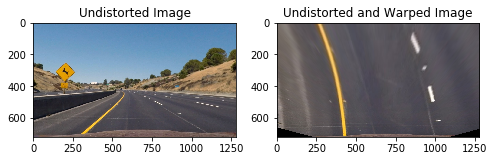

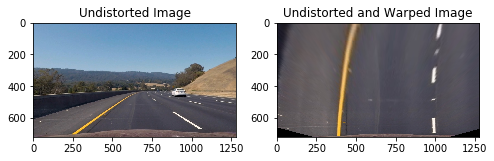

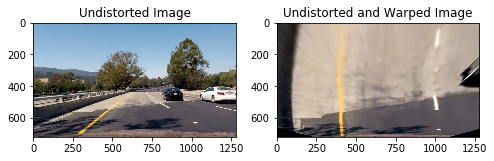

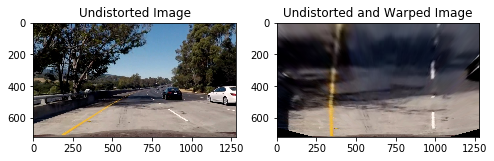

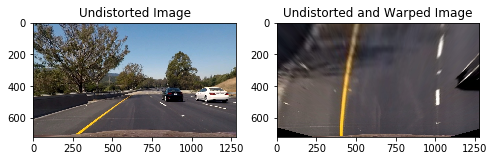

In [90]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    img = cal_undistort(img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Undistorted Image')
    warped, M = perspec_trans(img)
    
    ax2.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted and Warped Image')

# Binary Threshold

In [129]:
def pipeline(img, s_thresh=(180, 255), sx_thresh=(60, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    r_channel = img[:, :, 0]
    g_channel = img[:, :, 1]
    b_channel = img[:, :, 2]
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    #threshold black color
    lbinary = np.zeros_like(scaled_sobel)
    lbinary[(l_channel >= 40)] = 1
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(lbinary == 1) & ((s_binary == 1) | (sxbinary == 1))] = 1
    return combined_binary

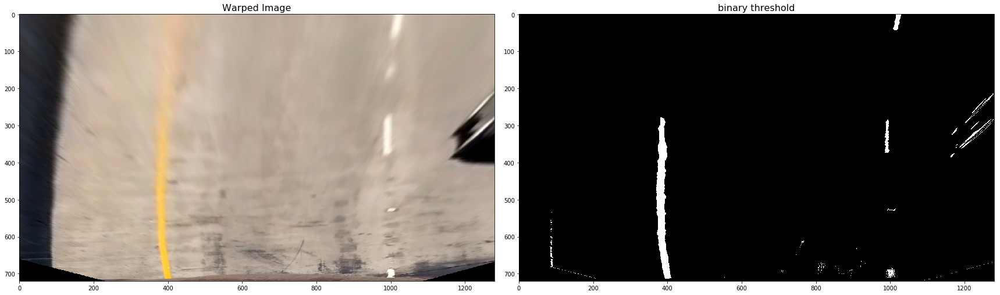

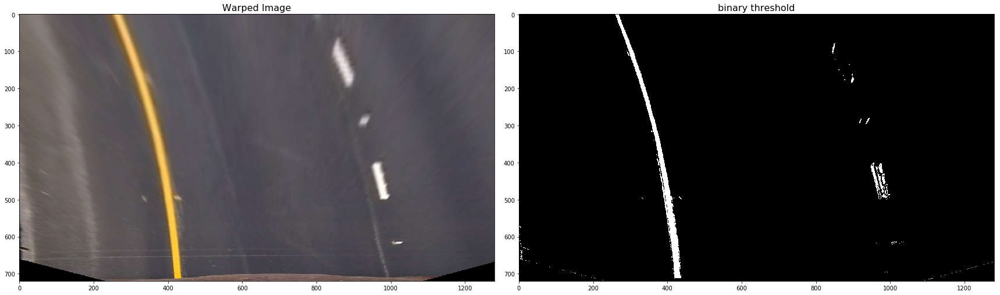

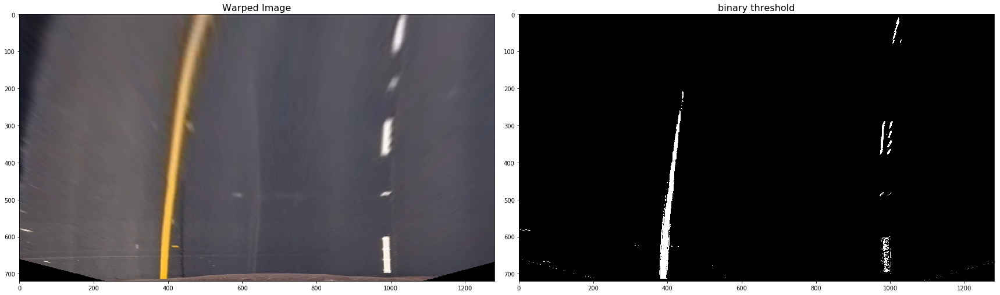

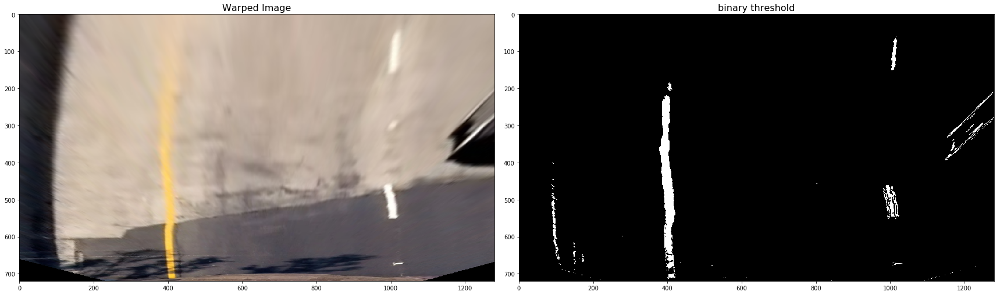

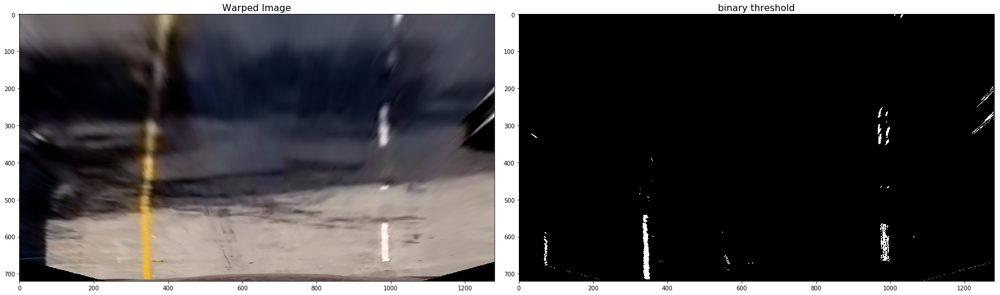

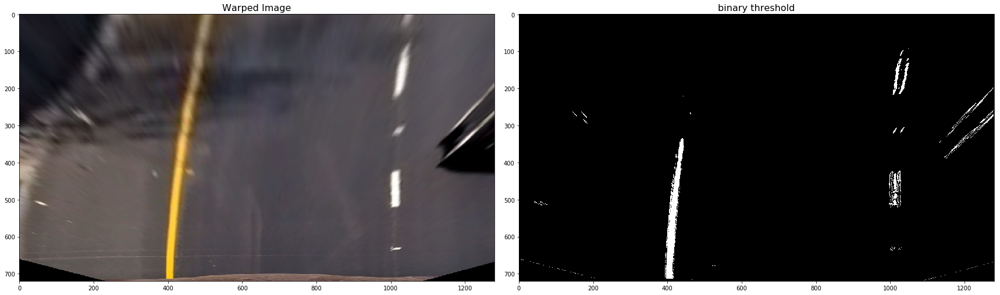

In [94]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    img = cal_undistort(img)
    warped, M = perspec_trans(img)
    result = pipeline(warped)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.set_title('Warped Image', fontsize=16)
    ax1.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB).astype('uint8'))
        
    ax2.set_title('binary threshold', fontsize=16)
    ax2.imshow(result, cmap='gray')

# Fit a Polynomial

In [100]:
def fit_track(binary_warped, warped, origin_img, read=False):
        # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # add margin point to calculate car position and extend drawing area
    left_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    left_top = left_fit[2]
    right_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    right_top = right_fit[2]
    leftx = np.append(leftx, left_int)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 720)
    lefty = np.append(lefty, 0)
    rightx = np.append(rightx,right_int)
    rightx = np.append(rightx,right_top)
    righty = np.append(righty, 720)
    righty = np.append(righty, 0)
    lefty = lefty[np.argsort(lefty)]
    leftx = leftx[np.argsort(lefty)]
    righty = righty[np.argsort(righty)]
    rightx = rightx[np.argsort(righty)]
    
    # Measure Radius of Curvature for each lane line
    ym_per_pix = 30./720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*np.max(lefty)* ym_per_pix + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*np.max(lefty)* ym_per_pix + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    
    #Get vehicle position
    center = abs(640 - ((right_int+left_int)/2))
    
    #unwarp back to origin image
    img_size = (origin_img.shape[1], origin_img.shape[0])
    corners = np.float32([[250,720],[600,457],[720,457],[1145,720]])
    new_top_left=np.array([corners[0,0],0])
    new_top_right=np.array([corners[3,0],0])
    offset=[150,0]
    src = np.float32([corners[0],corners[1],corners[2],corners[3]])
    dst = np.float32([corners[0]+offset,new_top_left+offset,new_top_right-offset ,corners[3]-offset])
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (binary_warped.shape[1], binary_warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(origin_img, 1, newwarp, 0.3, 0)
    
    if read == True:
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()

        ax1.set_title('Warped Image', fontsize=16)
        ax1.imshow(cv2.cvtColor(warped, cv2.COLOR_BGR2RGB))
        ax1.plot(left_fitx, lefty, color='yellow', linewidth=10)
        ax1.plot(right_fitx, righty, color='yellow', linewidth=10)
        
        ax2.set_title('Unwarped Image', fontsize=16)
        ax2.imshow(result)
        if center < 640:
            ax2.text(200, 100, 'Vehicle is {:.2f}m left of center'.format(center*xm_per_pix),
                 style='italic', color='white', fontsize=20)
        else:
            ax2.text(200, 100, 'Vehicle is {:.2f}m right of center'.format(center*xm_per_pix),
                 style='italic', color='white', fontsize=20)
        ax2.text(200, 175, 'Curvature: {}m'.format(int((left_curverad + right_curverad)/2)),
             style='italic', color='white', fontsize=20)
        
        #plt.xlim(0, 1280)
        #plt.ylim(720, 0)
    
    return left_fit, right_fit

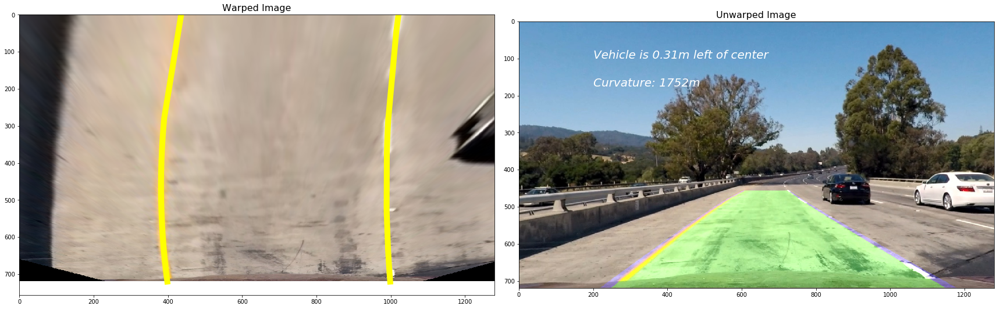

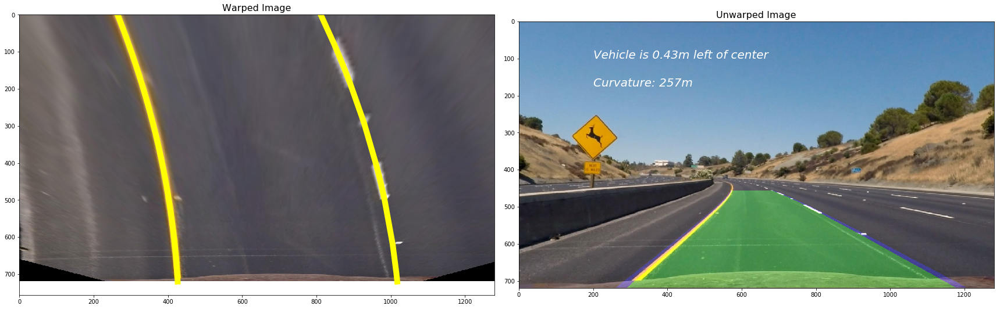

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


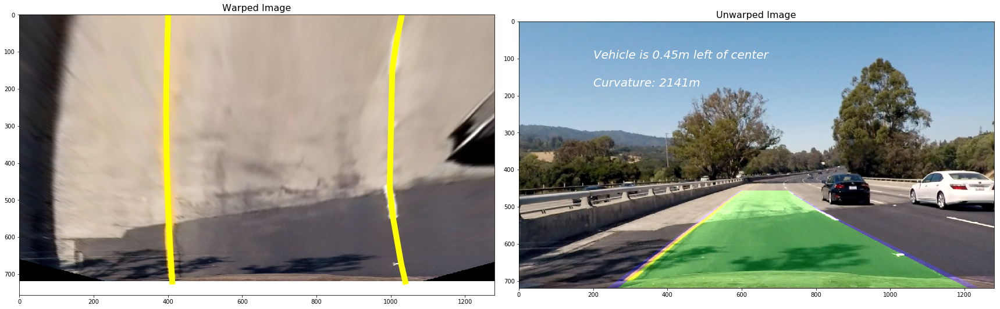

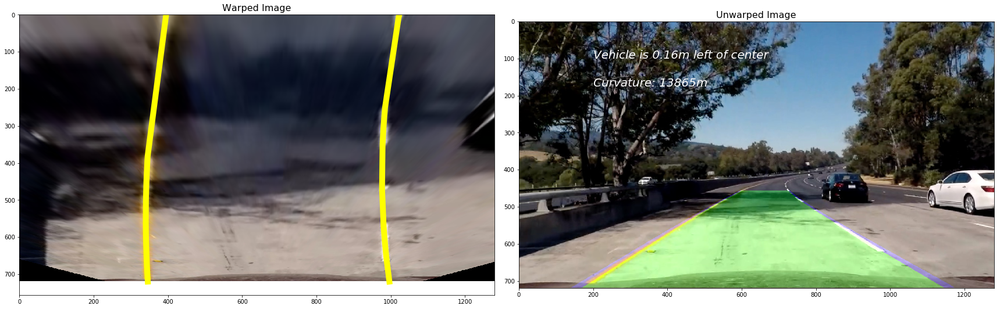

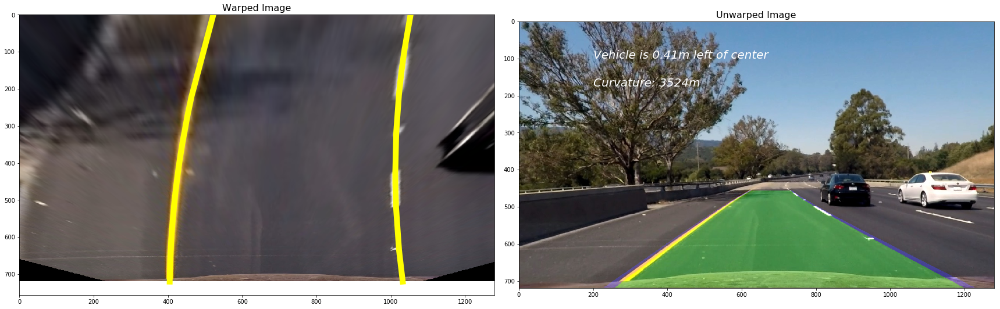

In [101]:
for image in glob.glob('test_images/test*.jpg'):
    img = cv2.imread(image)
    img = cal_undistort(img)
    warped, M = perspec_trans(img)
    binary_warped = pipeline(np.array(warped))

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    left_fit, right_fit= fit_track(binary_warped, warped, img, read=True)
    

In [126]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [] 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
    def slide_window_tracked(self, img):
        
        #line detected, simple search in a margin around the previous line position
        binary_warped = img
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 50
        lane_inds = ((nonzerox > (self.best_fit[0]*(nonzeroy**2) + self.best_fit[1]*nonzeroy + 
        self.best_fit[2] - margin)) & (nonzerox < (self.best_fit[0]*(nonzeroy**2) + 
        self.best_fit[1]*nonzeroy + self.best_fit[2] + margin)))  

        # Again, extract line pixel positions
        self.allx = nonzerox[lane_inds]
        self.ally = nonzeroy[lane_inds] 

        # Fit a second order polynomial to each
        #fit = np.polyfit(self.ally, self.allx, 2)
        
        if (len(self.allx) > 0):
            self.detected = True
        else:
            self.detected = False
            
        #self.current_fit = fit
    
    def slide_window_untracked(self, img):
        
        #blind search a line
        # Take a histogram of the bottom half of the image
        binary_warped = img
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        if self == Right:
            x_base = np.argmax(histogram[midpoint:]) + midpoint
        else:
            x_base = np.argmax(histogram[:midpoint])

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        x_current = x_base
        # Set the width of the windows +/- margin
        margin = 50
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive lane pixel indices
        lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_x_low = x_current - margin
            win_x_high = x_current + margin
            
            # Identify the nonzero pixels in x and y within the window
            good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_x_low) &  (nonzerox < win_x_high)).nonzero()[0]
            # Append these indices to the lists
            lane_inds.append(good_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_inds) > minpix:
                x_current = np.int(np.mean(nonzerox[good_inds]))

        # Concatenate the arrays of indices
        lane_inds = np.concatenate(lane_inds)

        # Extract line pixel positions
        x = nonzerox[lane_inds]
        y = nonzeroy[lane_inds] 
        self.allx = x
        self.ally = y
        
        if len(x) > 0:
            self.detected = True
        else:
            self.detected = False
            
        # Fit a second order polynomial to each
        #fit = np.polyfit(y, x, 2)
        #self.current_fit = fit
    def check_fit(self, fit):
        #check whether this fit should be added and used
        if fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(fit - self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1 or self.diffs[2] > 100) and len(self.current_fit) > 0:
                self.detected = False
            else:
                self.detected = True
                self.current_fit.append(fit)
                if len(self.current_fit) > 3:
                    self.current_fit = self.current_fit[len(self.current_fit)-3:]
                self.best_fit = np.average(self.current_fit, axis=0)
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                self.best_fit = np.average(self.current_fit, axis=0)
                
    def get_curvature(self, x, y):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        fit_cr = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*np.max(y)* ym_per_pix + fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*fit_cr[0])
        return curverad




In [127]:
def video_proc_pipline(image):
    img_size = (image.shape[1], image.shape[0])
    nimage = np.copy(image)
    #nimage = cv2.cvtColor(nimage, cv2.COLOR_BGR2RGB)
    
    # Calibrate camera and undistort image
    #ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(nimage, mtx, dist, None, mtx)
    
    # Perform perspective transform
    corners = np.float32([[250,720],[600,457],[720,457],[1145,720]])
    new_top_left=np.array([corners[0,0],0])
    new_top_right=np.array([corners[3,0],0])
    offset=[150,0]
    src = np.float32([corners[0],corners[1],corners[2],corners[3]])
    dst = np.float32([corners[0]+offset,new_top_left+offset,new_top_right-offset ,corners[3]-offset])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(undist, M, img_size)
    
    #Get combined binary image
    combined_binary = pipeline(warped, s_thresh=(180, 255), sx_thresh=(60, 100))
    
    #Get left/right lane pixels
    if Left.detected == True:
        Left.slide_window_tracked(combined_binary)
    else:
        Left.slide_window_untracked(combined_binary)
    
    if Right.detected == True:
        Right.slide_window_tracked(combined_binary)
    else:
        Right.slide_window_untracked(combined_binary)
        
    
    #Get polynomial fit
    leftx = Left.allx
    lefty = Left.ally
    rightx = Right.allx
    righty = Right.ally
    
    if len(leftx)==0:
        left_fit = Left.best_fit
    else:
        left_fit = np.polyfit(lefty, leftx, 2)
    
    if len(rightx)==0:
        right_fit = Right.best_fit
    else:
        right_fit = np.polyfit(righty, rightx, 2)
    
    # add margin point to extend drawing area
    left_int = left_fit[0]*720**2 + left_fit[1]*720 + left_fit[2]
    left_top = left_fit[2]
    right_int = right_fit[0]*720**2 + right_fit[1]*720 + right_fit[2]
    right_top = right_fit[2]
    leftx = np.append(leftx, left_int)
    leftx = np.append(leftx, left_top)
    lefty = np.append(lefty, 720)
    lefty = np.append(lefty, 0)
    rightx = np.append(rightx,right_int)
    rightx = np.append(rightx,right_top)
    righty = np.append(righty, 720)
    righty = np.append(righty, 0)
    lefty = lefty[np.argsort(lefty)]
    leftx = leftx[np.argsort(lefty)]
    righty = righty[np.argsort(righty)]
    rightx = rightx[np.argsort(righty)]
    
    # check whether its a good fit
    Left.check_fit(left_fit)
    Right.check_fit(right_fit)
    
    left_fit = Left.best_fit
    right_fit = Right.best_fit
    
    # Fit polynomial to detected pixels and update x values
    left_fitx = left_fit[0]*lefty**2 + left_fit[1]*lefty + left_fit[2]
    right_fitx = right_fit[0]*righty**2 + right_fit[1]*righty + right_fit[2]
    
    #get the curvature for lanes
    left_curverad = Left.get_curvature(left_fitx, lefty)
    right_curverad = Right.get_curvature(right_fitx, righty)
    Left.radius_of_curvature = left_curverad
    Right.radius_of_curvature = right_curverad
    
    #get the vehicle position
    #position = (rightx_int+leftx_int)/2
    center = abs(640 - ((right_int+left_int)/2))
    #Left.line_base_pos = abs((640 - left_int)*3.7/700)
    #Right.line_base_pos = abs((640 - right_int)*3.7/700)
    #unwarped the detected region to image
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Create an image to draw the lines on
    binary_warped = combined_binary
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, lefty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, righty]))])
    pts = np.hstack((pts_left, pts_right))
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (binary_warped.shape[1], binary_warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    # Print related statistics
    if center < 640:
        cv2.putText(result, 'Vehicle is {:.2f}m left from center'.format(center*3.7/700), (100, 80),
                 fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 2)
    else:
        cv2.putText(result, 'Vehicle is {:.2f}m right from center'.format(center*3.7/700), (100, 80),
                 fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 2)
    cv2.putText(result, 'Radius of Curvature {}m'.format(int((Left.radius_of_curvature+Right.radius_of_curvature)/2)), (100,120),
             fontFace = 16, fontScale = 1, color=(255,255,255), thickness = 2)
    
    return result   
    

In [131]:
from moviepy.editor import VideoFileClip
Left = Line()
Right = Line()
video_output = 'result.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(video_proc_pipline) 
white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video result.mp4
[MoviePy] Writing video result.mp4


100%|█████████▉| 1260/1261 [03:29<00:00,  5.67it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: result.mp4 



In [182]:
from IPython.display import HTML
HTML("""
<video width="640" height="360" controls>
  <source src="{0}">
</video>
""".format('result.mp4'))

In [116]:
from moviepy.editor import VideoFileClip
Left = Line()
Right = Line()
challenge_output = 'harder_challenge_result.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
challenge_clip = clip1.fl_image(video_proc_pipline)
challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_result.mp4
[MoviePy] Writing video harder_challenge_result.mp4


100%|█████████▉| 1199/1200 [04:11<00:00,  5.31it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_result.mp4 

